In [1]:
import pandas as pd 
import matplotlib.pyplot as plt 
import numpy as np

df = pd.read_csv("../data/mbti_celebrities.csv")
pd.set_option('display.max_columns', None)
df.head(5)

,id,name,cat_id,category,sub_cat_id,subcategory,four_letter,four_letter_total_voted,enneagram,enneagram_total_voted,socionics,socionics_total_voted,instinctual_variant,instinctual_variant_total_voted,tritype,tritype_total_voted,temperaments,temperaments_total_voted,attitudinal_psyche,attitudinal_psyche_total_voted,big_5_SLOAN,big_5_SLOAN_total_voted,classic_jungian,classic_jungian_total_voted,letter_1,letter_1_percentage,letter_2,letter_2_percentage,letter_3,letter_3_percentage,letter_4,letter_4_percentage
0,376,Derek Jeter,5,Sports,11,Baseball,ISTJ,44,3w4,18,LSE,4,so/sp,6,316.0,3,Choleric-Phlegmatic,2,NaN,0,NaN,0,NaN,0,I,0.70,S,0.95,T,0.84,J,0.73
1,31023,Ichiro Suzuki,5,Sports,11,Baseball,ISTP,35,1w9,17,LSI,10,sp/sx,9,153.0,10,Phlegmatic [Dominant],6,FLEV,3,RCOEN,5,IS(T),2,I,1.00,S,0.97,T,0.97,P,0.74
2,25299,Trevor Bauer,5,Sports,11,Baseball,ENTP,42,8w7,24,ILE,8,sx/sp,9,854.0,13,Sanguine-Choleric,10,VLEF,2,SCOEI,3,EN(T),1,E,0.62,N,0.95,T,0.95,P,0.98
3,40744,Zack Greinke,5,Sports,11,Baseball,INTP,31,5w6,16,ILI,1,sp/sx,3,358.0,5,Phlegmatic [Dominant],5,NaN,0,RCUEI,2,NaN,0,I,1.00,N,0.97,T,1.00,P,0.81
4,6611,Babe Ruth,5,Sports,11,Baseball,ESTP,26,8w7,8,SLE,6,so/sx,3,873.0,3,Choleric-Sanguine,3,NaN,0,NaN,0,ES(F),1,E,0.96,S,0.92,T,0.92,P,0.96


In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50878 entries, 0 to 50877
Data columns (total 32 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   id                               50878 non-null  int64  
 1   name                             50878 non-null  object 
 2   cat_id                           50878 non-null  int64  
 3   category                         50878 non-null  object 
 4   sub_cat_id                       50878 non-null  int64  
 5   subcategory                      50878 non-null  object 
 6   four_letter                      50878 non-null  object 
 7   four_letter_total_voted          50878 non-null  int64  
 8   enneagram                        41196 non-null  object 
 9   enneagram_total_voted            50878 non-null  int64  
 10  socionics                        19672 non-null  object 
 11  socionics_total_voted            50878 non-null  int64  
 12  instinctual_varian

In [3]:
df.describe()

,id,cat_id,sub_cat_id,four_letter_total_voted,enneagram_total_voted,socionics_total_voted,instinctual_variant_total_voted,tritype,tritype_total_voted,temperaments_total_voted,attitudinal_psyche_total_voted,big_5_SLOAN_total_voted,classic_jungian_total_voted,letter_1_percentage,letter_2_percentage,letter_3_percentage,letter_4_percentage
count,5.087800e+04,50878.000000,50878.000000,50878.000000,50878.000000,50878.000000,50878.000000,24206.000000,50878.000000,50878.000000,50878.000000,50878.00000,50878.000000,50878.000000,50878.000000,50878.000000,50878.000000
mean,2.816054e+05,11.260564,2997.774795,21.477004,8.293958,1.744467,2.533079,570.523589,2.317898,2.266559,0.767208,1.22721,0.575514,0.919683,0.899515,0.909635,0.907000
std,1.963380e+05,7.716008,3493.943677,101.177218,35.165012,8.167881,11.645721,241.972311,10.157548,9.122393,3.920783,5.51141,3.427697,0.141050,0.153625,0.148036,0.148256
min,4.200000e+01,1.000000,11.000000,1.000000,0.000000,0.000000,0.000000,125.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.250000,0.200000,0.250000,0.250000
25%,1.198190e+05,5.000000,275.000000,2.000000,1.000000,0.000000,0.000000,379.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.890000,0.830000,0.860000,0.850000
50%,2.563935e+05,14.000000,3424.000000,5.000000,2.000000,0.000000,0.000000,549.000000,0.000000,0.000000,0.000000,0.00000,0.000000,1.000000,1.000000,1.000000,1.000000
75%,4.229048e+05,16.000000,3514.000000,13.000000,5.000000,1.000000,2.000000,782.000000,2.000000,2.000000,0.000000,1.00000,0.000000,1.000000,1.000000,1.000000,1.000000
max,1.113366e+06,29.000000,46028.000000,8479.000000,2526.000000,651.000000,750.000000,974.000000,702.000000,499.000000,299.000000,365.00000,370.000000,1.000000,1.000000,1.000000,1.000000


In [4]:
df['four_letter'].describe()

count     50878
unique       16
top        ENFP
freq       5486
Name: four_letter, dtype: object

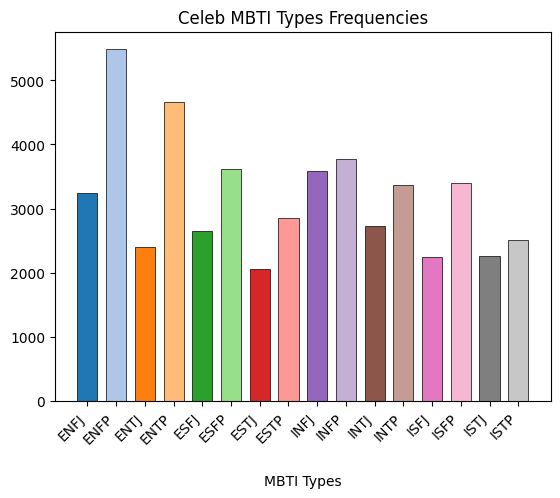

Four Letter Count: 50878


In [5]:
# Next let's visualize some of these frequencies 

x = df['four_letter'].value_counts().sort_index()

colors = plt.cm.tab20.colors

x_pos = np.arange(len(x))

bars=plt.bar(x_pos, x.values, color=colors, width=0.7, edgecolor='black', linewidth=0.5)

plt.title("Celeb MBTI Types Frequencies")
plt.xlabel('MBTI Types', labelpad=20)
plt.xticks(x_pos, x.index, rotation=45, ha='right')
plt.show()

print(f"Four Letter Count: {len(df['four_letter'].dropna())}")


In [6]:
df['enneagram'].value_counts()

enneagram
7w6    3820
7w8    3156
4w5    2868
5w6    2734
9w1    2710
4w3    2685
5w4    2639
8w7    2487
3w4    2429
3w2    2382
6w7    2166
6w5    2043
2w3    1918
9w8    1674
1w9    1651
1w2    1574
8w9    1197
2w1    1063
Name: count, dtype: int64

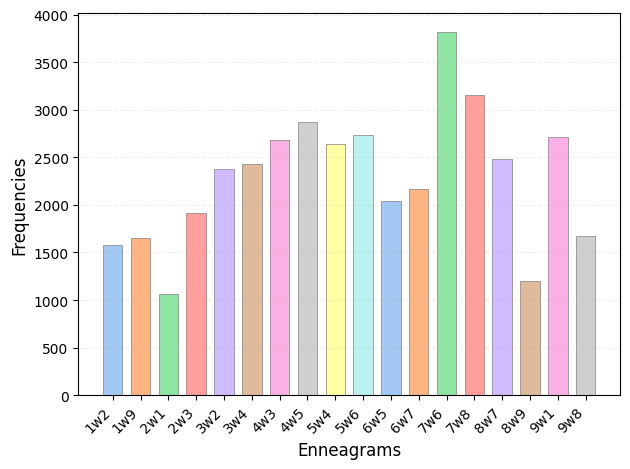

Enneagram Count: 41196


In [7]:
import seaborn as sns

x = df['enneagram'].dropna().value_counts().sort_index()

colors = sns.color_palette("pastel")

x_pos = np.arange(len(x))
bars = plt.bar(x_pos, x.values, color=colors, width=0.7, edgecolor='gray', linewidth=0.5)
plt.xlabel("Enneagrams", fontsize=12)
plt.ylabel("Frequencies", fontsize=12)
plt.xticks(x_pos, x.index, rotation=45, ha='right')
plt.grid(axis='y', alpha=0.2, linestyle='--')
plt.tight_layout()

plt.show()

print(f"Enneagram Count: {len(df['enneagram'].dropna())}")


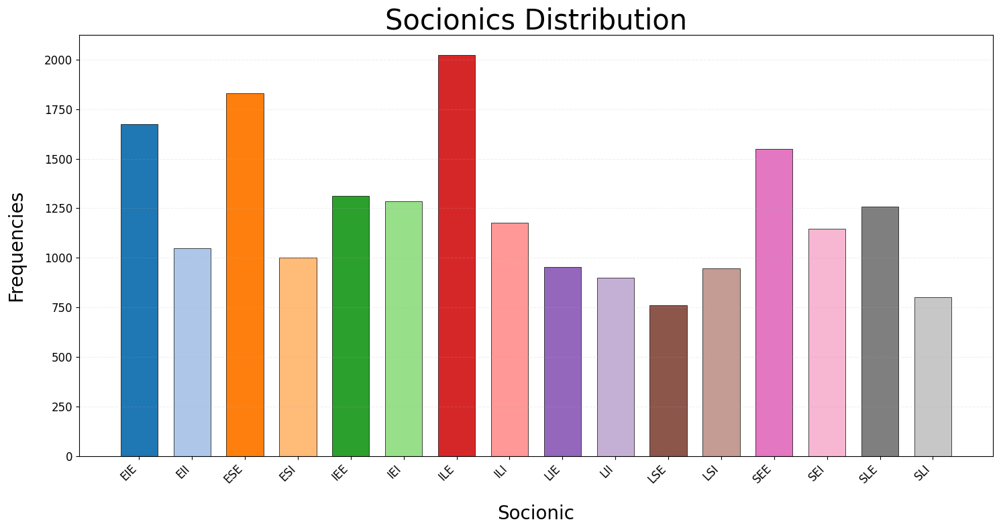

Socionics Count: 19672


In [30]:
import seaborn as sns

x = df['socionics'].dropna().value_counts().sort_index()

colors = sns.color_palette("tab20")
plt.figure(figsize=(15, 8))

x_pos = np.arange(len(x))
bars = plt.bar(x_pos, x.values, color=colors, width=0.7, edgecolor='black', linewidth=0.5)
plt.title("Socionics Distribution", fontsize=30)
plt.xlabel("Socionic", fontsize=20, labelpad=20)
plt.ylabel("Frequencies", fontsize=20, labelpad=20)
plt.xticks(x_pos, x.index, rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', alpha=0.2, linestyle='--')
plt.tight_layout()

plt.show()

print(f"Socionics Count: {len(df['socionics'].dropna())}")

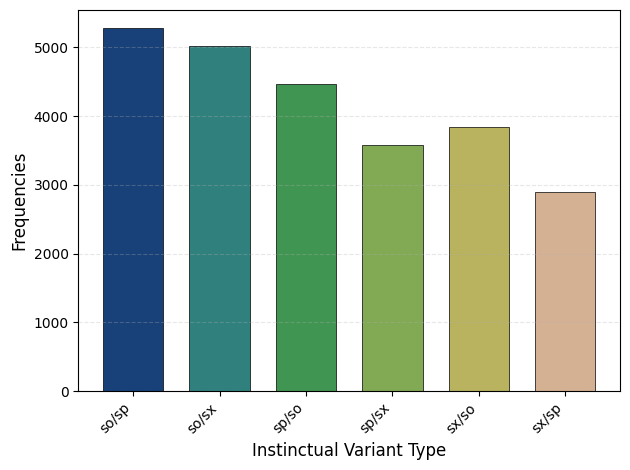

Instinctual Variant Count: 25079


In [9]:
x = df['instinctual_variant'].dropna().value_counts().sort_index()

colors = sns.color_palette("gist_earth")

x_pos = np.arange(len(x))
bars = plt.bar(x_pos, x.values, color=colors, width=0.7, edgecolor='black', linewidth=0.5)
plt.xlabel("Instinctual Variant Type", fontsize=12)
plt.ylabel("Frequencies", fontsize=12)
plt.xticks(x_pos, x.index, rotation=45, ha='right')
plt.grid(axis='y', alpha=0.3, linestyle='--')
plt.tight_layout()

plt.show()

print(f"Instinctual Variant Count: {len(df['instinctual_variant'].dropna())}")

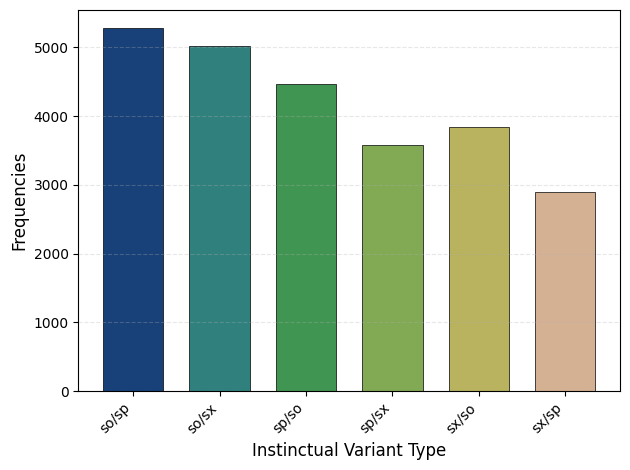

Instinctual Variant Count: 25079


In [10]:
x = df['instinctual_variant'].dropna().value_counts().sort_index()

colors = sns.color_palette("gist_earth")

x_pos = np.arange(len(x))
bars = plt.bar(x_pos, x.values, color=colors, width=0.7, edgecolor='black', linewidth=0.5)
plt.xlabel("Instinctual Variant Type", fontsize=12)
plt.ylabel("Frequencies", fontsize=12)
plt.xticks(x_pos, x.index, rotation=45, ha='right')
plt.grid(axis='y', alpha=0.3, linestyle='--')
plt.tight_layout()

plt.show()

print(f"Instinctual Variant Count: {len(df['instinctual_variant'].dropna())}")

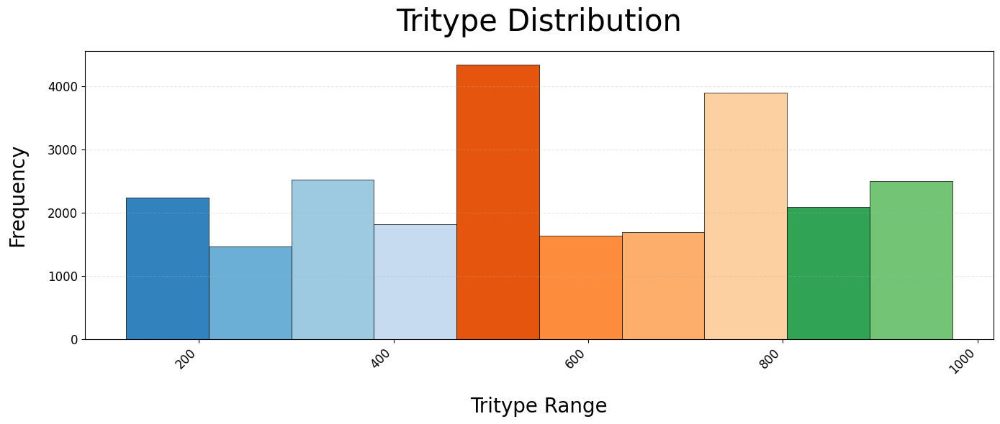

Tritype Count: 24206


In [11]:

x = df['tritype'].dropna()

num_bins = 10

colors = sns.color_palette("tab20c")

plt.figure(figsize=(14, 6))

n, bins, patches = plt.hist(x, bins=num_bins, edgecolor='black', linewidth=0.5)

for patch, color in zip(patches, colors):
    patch.set_facecolor(color)

plt.title("Tritype Distribution", fontsize=30, pad=20)
plt.xlabel('Tritype Range', labelpad=20, fontsize=20)
plt.ylabel('Frequency', fontsize=20, labelpad=20)

plt.xticks(rotation=45, ha='right', fontsize = 12)
plt.yticks(fontsize=12)

plt.grid(axis='y', alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()

print(f"Tritype Count: {len(df['tritype'].dropna())}")


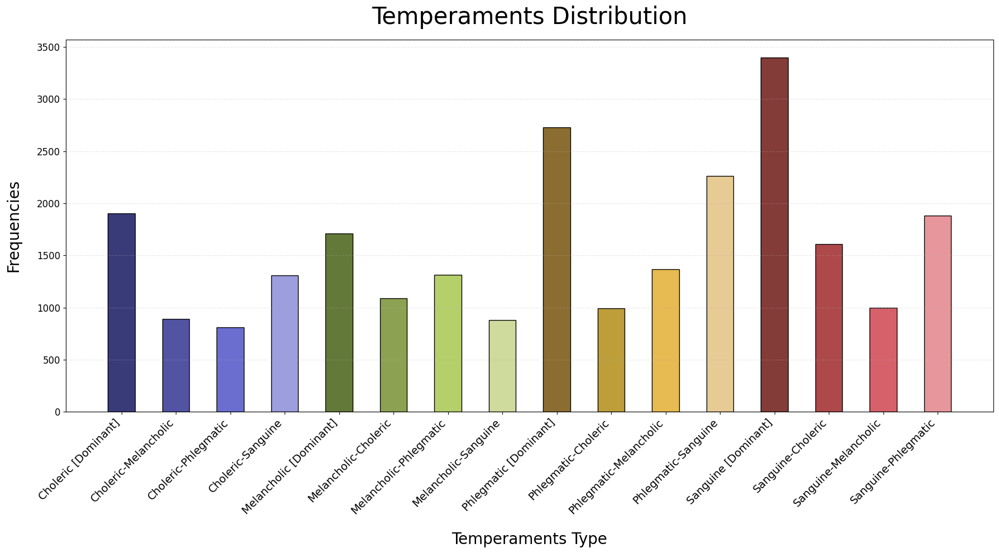

Temperaments Count: 25153


In [12]:
x = df['temperaments'].dropna().value_counts().sort_index()

colors = sns.color_palette("tab20b")

plt.figure(figsize=(18, 10))

x_pos = np.arange(len(x))
bars = plt.bar(x_pos, x.values, color=colors, width=0.5, edgecolor='black', linewidth=1)
plt.title("Temperaments Distribution", fontsize=30, pad=20)
plt.xlabel("Temperaments Type", fontsize=20, labelpad=20)
plt.ylabel("Frequencies", fontsize=20, labelpad=20)
plt.xticks(x_pos, x.index, rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=12)
plt.grid(axis='y', alpha=0.3, linestyle='--')
plt.tight_layout()

plt.show()

print(f"Temperaments Count: {len(df['temperaments'].dropna())}")

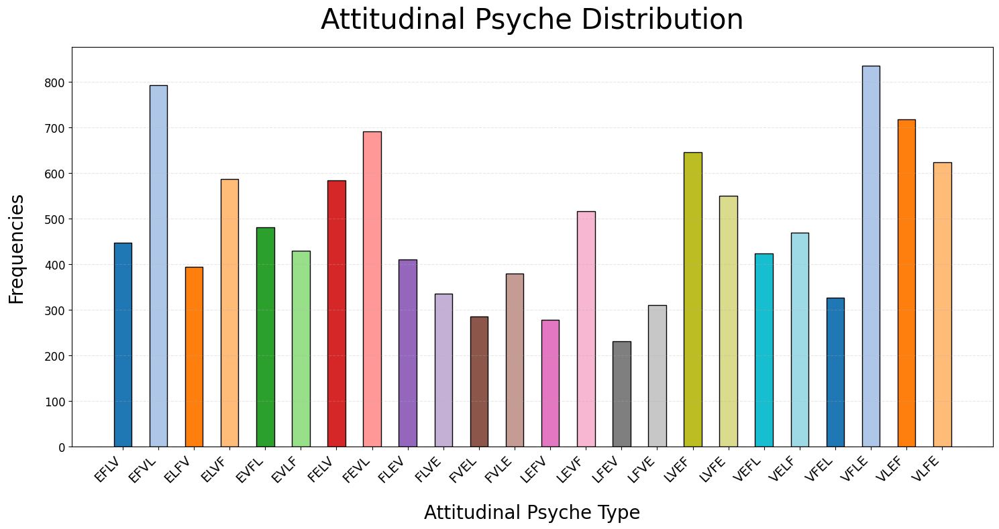

Attitudinal Psyche Count: 11743


In [20]:
x= df['attitudinal_psyche'].dropna().value_counts().sort_index()

colors = sns.color_palette("tab20")

plt.figure(figsize=(15, 8))

x_pos = np.arange(len(x))
bars = plt.bar(x_pos, x.values, color=colors, width=0.5, edgecolor='black', linewidth=1)
plt.title("Attitudinal Psyche Distribution", fontsize=30, pad=20)
plt.xlabel("Attitudinal Psyche Type", fontsize=20, labelpad=20)
plt.ylabel("Frequencies", fontsize=20, labelpad=20)
plt.xticks(x_pos, x.index, rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=12)
plt.grid(axis='y', alpha=0.3, linestyle='--')
plt.tight_layout()

plt.show()

print(f"Attitudinal Psyche Count: {len(df['attitudinal_psyche'].dropna())}")


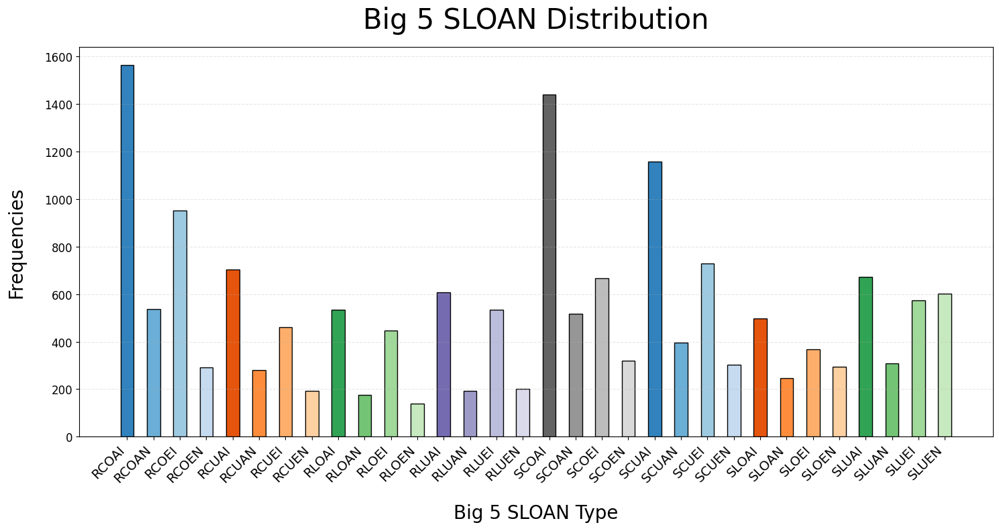

Big 5 SLOAN Count: 16908


In [24]:
x = df['big_5_SLOAN'].dropna().value_counts().sort_index()

colors = sns.color_palette("tab20c")

plt.figure(figsize=(15, 8))

x_pos = np.arange(len(x))
bars = plt.bar(x_pos, x.values, color=colors, width=0.5, edgecolor='black', linewidth=1)
plt.title("Big 5 SLOAN Distribution", fontsize=30, pad=20)
plt.xlabel("Big 5 SLOAN Type", fontsize=20, labelpad=20)
plt.ylabel("Frequencies", fontsize=20, labelpad=20)
plt.xticks(x_pos, x.index, rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=12)
plt.grid(axis='y', alpha=0.3, linestyle='--')
plt.tight_layout()

plt.show()

print(f"Big 5 SLOAN Count: {len(df['big_5_SLOAN'].dropna())}")

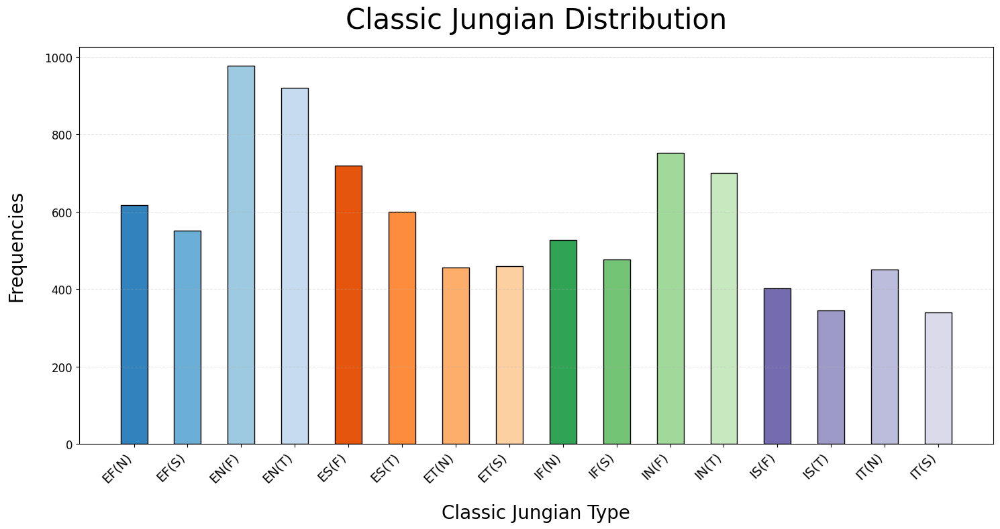

Classic Jungian Count: 9285


In [25]:
x = df['classic_jungian'].dropna().value_counts().sort_index()

colors = sns.color_palette("tab20c")

plt.figure(figsize=(15, 8))

x_pos = np.arange(len(x))
bars = plt.bar(x_pos, x.values, color=colors, width=0.5, edgecolor='black', linewidth=1)
plt.title("Classic Jungian Distribution", fontsize=30, pad=20)
plt.xlabel("Classic Jungian Type", fontsize=20, labelpad=20)
plt.ylabel("Frequencies", fontsize=20, labelpad=20)
plt.xticks(x_pos, x.index, rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=12)
plt.grid(axis='y', alpha=0.3, linestyle='--')
plt.tight_layout()

plt.show()

print(f"Classic Jungian Count: {len(df['classic_jungian'].dropna())}")

In [86]:
df['category'].value_counts()

category
Pop Culture    12389
Internet       11219
Sports          5376
Musician        4528
The Arts        4242
Historical      3107
Noteworthy      2370
Science         2090
Kpop            1689
Political       1633
Religion        1379
Business         856
Name: count, dtype: int64

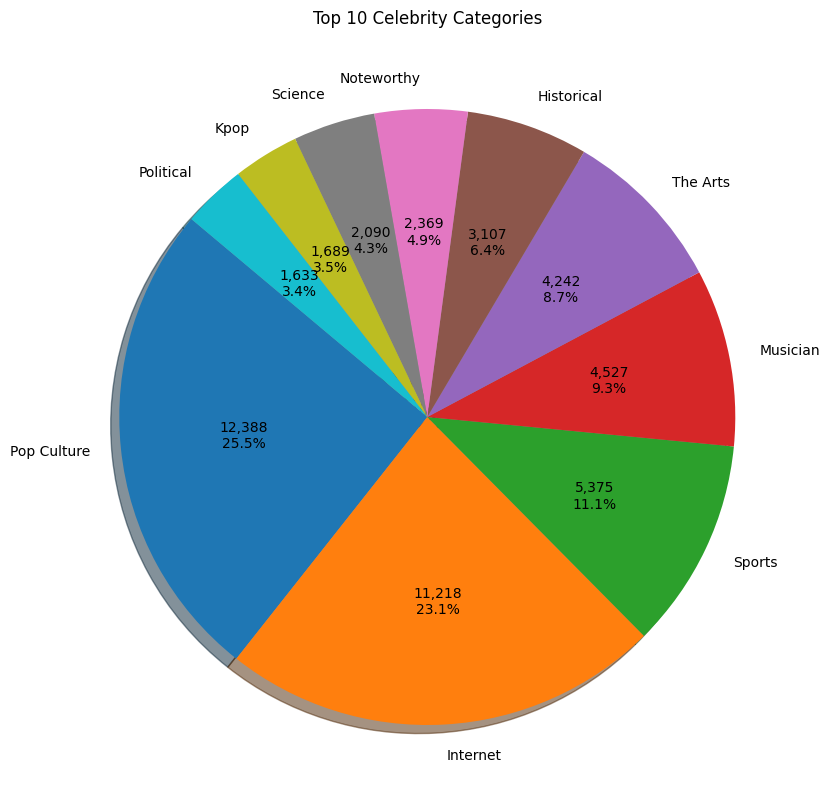

In [81]:
#plotting top 10 categories

x= df['category'].dropna().value_counts().sort_values(ascending=False)[:10]

plt.figure(figsize=(18,10))
plt.title("Top 10 Celebrity Categories")
plt.pie(x.values, labels=x.index, colors = sns.color_palette("tab10"),
        autopct=lambda pct: f'{int(pct/100*sum(x.values)):,}\n{(pct/100):.1%}', shadow=True, startangle=140)

plt.show()




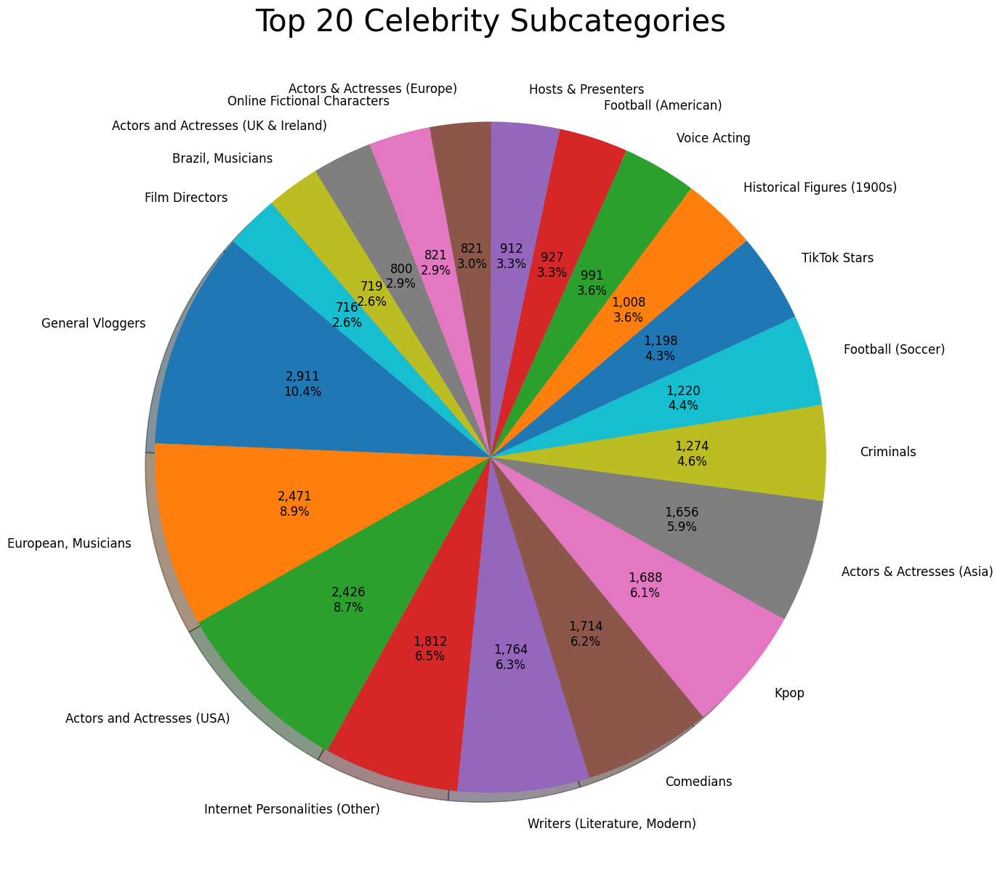

In [80]:
# plotting top 20 sub categories
x= df['subcategory'].dropna().value_counts().sort_values(ascending=False)[:20]


plt.figure(figsize=(20,15))
plt.title("Top 20 Celebrity Subcategories", fontsize=30)
plt.pie(x.values, labels=x.index, colors = sns.color_palette("tab10"), textprops={'fontsize': 12},
        autopct=lambda pct: f'{int(pct/100*sum(x.values)):,}\n{(pct/100):.1%}', shadow=True, startangle=140)
plt.show()

# Exploring Correlations 
#### Now that the value counts are explicitly visualized, next lets investigate correlations between some of these categorical features.

In [87]:
df.head(1)

,id,name,cat_id,category,sub_cat_id,subcategory,four_letter,four_letter_total_voted,enneagram,enneagram_total_voted,socionics,socionics_total_voted,instinctual_variant,instinctual_variant_total_voted,tritype,tritype_total_voted,temperaments,temperaments_total_voted,attitudinal_psyche,attitudinal_psyche_total_voted,big_5_SLOAN,big_5_SLOAN_total_voted,classic_jungian,classic_jungian_total_voted,letter_1,letter_1_percentage,letter_2,letter_2_percentage,letter_3,letter_3_percentage,letter_4,letter_4_percentage
0,376,Derek Jeter,5,Sports,11,Baseball,ISTJ,44,3w4,18,LSE,4,so/sp,6,316.0,3,Choleric-Phlegmatic,2,NaN,0,NaN,0,NaN,0,I,0.7,S,0.95,T,0.84,J,0.73


In [94]:
"""
Let's create heatmaps between every one of the important personality measure features including 4 
letter MBTI, enneagram, socionics, instinctual variant, tritype, temperaments, attitudinal pysche, 
big 5 SLOAN, and classic jungian (9 features).  
"""

from itertools import combinations 


df['tritype_bucket'] = pd.cut(
        df['tritype'], 
        bins=10, 
        labels=['100-200', '200-300', '300-400', '400-500', 
                '500-600', '600-700', '700-800', '800-900', 
                '900-1000', '1000+']
        )

features=['four_letter', 'enneagram', 'temperaments', 'tritype_bucket', 
        'socionics', 'instinctual_variant', 'attitudinal_psyche', 'big_5_SLOAN', 'classic_jungian']



feature_pairs = list(combinations(features, 2))
num_p = len(feature_pairs)

# calc rows and cols
num_c = 1
num_r = (num_p + num_c - 1) // num_c 

fig, axes = plt.subplots(num_r, num_c, figsize=(24, 8*num_r))
axes = axes.flatten()

for i, (feat1, feat2) in enumerate(feature_pairs):
    ax = axes[i]
    
    # drop rows where either value is null in both features 
    df_clean = df[[feat1, feat2]].dropna()
    
    # create crosstab with clean data
    crosstab = pd.crosstab(df_clean[feat1], df_clean[feat2])
    
    sns.heatmap(crosstab, annot=True, fmt='d', cmap='YlOrRd', 
                cbar_kws={'label': 'Count'}, ax=ax)
    
    # show how many valid records
    n_valid = len(df_clean)
    ax.set_title(f'{feat1} vs {feat2}\n(n={n_valid:,})', fontsize=12, pad=10)
    ax.set_xlabel(feat2, fontsize=14, labelpad=20 )
    ax.set_ylabel(feat1, fontsize=14, labelpad=20)
    ax.tick_params(axis='x', rotation=45, labelsize=12)
    ax.tick_params(axis='y', rotation=0, labelsize=12)

# get rid of axes 
for i in range(num_p, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()





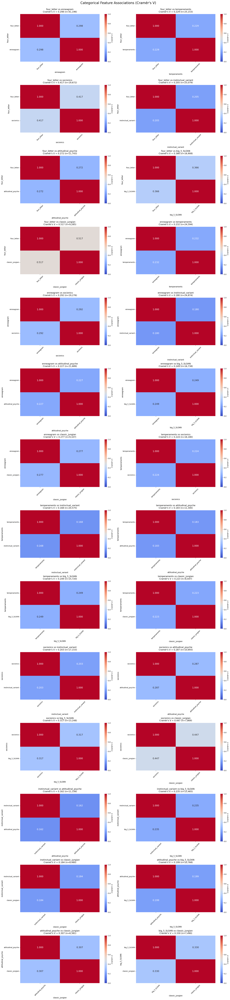

For features ('four_letter', 'classic_jungian'), their Cramer V correlation is 0.5170283505700292
For features ('socionics', 'classic_jungian'), their Cramer V correlation is 0.44717060056247276
For features ('four_letter', 'socionics'), their Cramer V correlation is 0.41720770802163004
For features ('four_letter', 'big_5_SLOAN'), their Cramer V correlation is 0.36618468695802275


In [120]:
# Let's measure the Cramer's V for all the categorical variables and plot confusion matrices 
from association_metrics import CramersV

import warnings
warnings.filterwarnings('ignore')

cat_features= ['four_letter', 'enneagram', 'temperaments', 
        'socionics', 'instinctual_variant', 'attitudinal_psyche', 'big_5_SLOAN', 'classic_jungian']

feature_pairs = list(combinations(cat_features, 2))
num_p = len(feature_pairs)

# calc rows and cols
num_c = 2 
num_r = (num_p + num_c - 1) // num_c 

fig, axes = plt.subplots(num_r, num_c, figsize=(20, 6*num_r))
axes = axes.flatten()

cv_values = {}

for i, (feat1, feat2) in enumerate(feature_pairs):
    ax = axes[i]
    
    # drop rows where either value is null in both features 
    df_clean = df[[feat1, feat2]].dropna()
    

    # convert to categorical type 
    df_clean = df_clean.astype('category')
    
    # calculate Cramer's V with column names
    cramersv = CramersV(df_clean)
    c_v_matrix = cramersv.fit()  
    
    sns.heatmap(c_v_matrix, annot=True, fmt='.3f', cmap='coolwarm', 
                vmin=0, vmax=1,
                cbar_kws={'label': "Cramér's V"}, ax=ax,
                annot_kws={'fontsize': 14})
    
    # show how many valid records and Cramer's V value
    n_valid = len(df_clean)
    cv_value = c_v_matrix.iloc[0, 1]

    #save for comparison
    if cv_value > 0.35: 
        cv_values[(feat1, feat2)] = cv_value

    ax.set_title(f'{feat1} vs {feat2}\nCramér\'s V = {cv_value:.3f} (n={n_valid:,})', 
                 fontsize=13, pad=10)
    ax.set_xlabel(feat2, fontsize=11)
    ax.set_ylabel(feat1, fontsize=11)
    ax.tick_params(axis='x', rotation=45, labelsize=10)
    ax.tick_params(axis='y', rotation=0, labelsize=10)


for i in range(num_p, len(axes)):
    axes[i].set_visible(False)

plt.suptitle('Categorical Feature Associations (Cramér\'s V)', fontsize=20, y=1.0)
plt.tight_layout()
plt.show()

sorted_items = sorted(cv_values.items(), key=lambda item: item[1], reverse=True)

for features, cv_value in sorted_items:
    print(f"For features {features}, their Cramer V correlation is {cv_value}")


#### From this correlation analysis, it seems four_letter, classic_jungian, and socionics are most closely related to each other as well as the Big 5 SLOAN. This makes sense as these metrics are similar in style and pattern embeddings. 

---

# Basic Cleaning

In [128]:
df_clean = df.dropna()
print(f"Total amount of celebrity records including all metrics: {len(df_clean)}")

Total amount of celebrity records including all metrics: 5867


In [133]:
df_clean = df[['name', 'category', 'subcategory', 'four_letter', 'enneagram', 'temperaments', 'tritype',
        'socionics', 'instinctual_variant', 'attitudinal_psyche', 'big_5_SLOAN', 'classic_jungian']]
df_clean.head(5)

,name,category,subcategory,four_letter,enneagram,temperaments,tritype,socionics,instinctual_variant,attitudinal_psyche,big_5_SLOAN,classic_jungian
0,Derek Jeter,Sports,Baseball,ISTJ,3w4,Choleric-Phlegmatic,316.0,LSE,so/sp,NaN,NaN,NaN
1,Ichiro Suzuki,Sports,Baseball,ISTP,1w9,Phlegmatic [Dominant],153.0,LSI,sp/sx,FLEV,RCOEN,IS(T)
2,Trevor Bauer,Sports,Baseball,ENTP,8w7,Sanguine-Choleric,854.0,ILE,sx/sp,VLEF,SCOEI,EN(T)
3,Zack Greinke,Sports,Baseball,INTP,5w6,Phlegmatic [Dominant],358.0,ILI,sp/sx,NaN,RCUEI,NaN
4,Babe Ruth,Sports,Baseball,ESTP,8w7,Choleric-Sanguine,873.0,SLE,so/sx,NaN,NaN,ES(F)


--- 

# Dimensionality Reduction

In [142]:
from sklearn.decomposition import PCA 
from sklearn.preprocessing import OneHotEncoder

cat_features= ['four_letter', 'enneagram', 'temperaments', 
        'socionics', 'instinctual_variant', 'attitudinal_psyche', 'big_5_SLOAN', 'classic_jungian']

df_cat = df[cat_features].dropna()

# encode categorical featrues
df_encode = pd.get_dummies(df_cat, columns=cat_features)

print(f"Original shape: {df_clean.shape}")

# add in tritype feature
df_all = df_encode.join(df_clean['tritype'])

print(f"Encoded shape: {df_all.shape}") 

df_all.head()



Original shape: (50878, 12)
Encoded shape: (5894, 145)


,four_letter_ENFJ,four_letter_ENFP,four_letter_ENTJ,four_letter_ENTP,four_letter_ESFJ,four_letter_ESFP,four_letter_ESTJ,four_letter_ESTP,four_letter_INFJ,four_letter_INFP,four_letter_INTJ,four_letter_INTP,four_letter_ISFJ,four_letter_ISFP,four_letter_ISTJ,four_letter_ISTP,enneagram_1w2,enneagram_1w9,enneagram_2w1,enneagram_2w3,enneagram_3w2,enneagram_3w4,enneagram_4w3,enneagram_4w5,enneagram_5w4,enneagram_5w6,enneagram_6w5,enneagram_6w7,enneagram_7w6,enneagram_7w8,enneagram_8w7,enneagram_8w9,enneagram_9w1,enneagram_9w8,temperaments_Choleric [Dominant],temperaments_Choleric-Melancholic,temperaments_Choleric-Phlegmatic,temperaments_Choleric-Sanguine,temperaments_Melancholic [Dominant],temperaments_Melancholic-Choleric,temperaments_Melancholic-Phlegmatic,temperaments_Melancholic-Sanguine,temperaments_Phlegmatic [Dominant],temperaments_Phlegmatic-Choleric,temperaments_Phlegmatic-Melancholic,temperaments_Phlegmatic-Sanguine,temperaments_Sanguine [Dominant],temperaments_Sanguine-Choleric,temperaments_Sanguine-Melancholic,temperaments_Sanguine-Phlegmatic,socionics_EIE,socionics_EII,socionics_ESE,socionics_ESI,socionics_IEE,socionics_IEI,socionics_ILE,socionics_ILI,socionics_LIE,socionics_LII,socionics_LSE,socionics_LSI,socionics_SEE,socionics_SEI,socionics_SLE,socionics_SLI,instinctual_variant_so/sp,instinctual_variant_so/sx,instinctual_variant_sp/so,instinctual_variant_sp/sx,instinctual_variant_sx/so,instinctual_variant_sx/sp,attitudinal_psyche_EFLV,attitudinal_psyche_EFVL,attitudinal_psyche_ELFV,attitudinal_psyche_ELVF,attitudinal_psyche_EVFL,attitudinal_psyche_EVLF,attitudinal_psyche_FELV,attitudinal_psyche_FEVL,attitudinal_psyche_FLEV,attitudinal_psyche_FLVE,attitudinal_psyche_FVEL,attitudinal_psyche_FVLE,attitudinal_psyche_LEFV,attitudinal_psyche_LEVF,attitudinal_psyche_LFEV,attitudinal_psyche_LFVE,attitudinal_psyche_LVEF,attitudinal_psyche_LVFE,attitudinal_psyche_VEFL,attitudinal_psyche_VELF,attitudinal_psyche_VFEL,attitudinal_psyche_VFLE,attitudinal_psyche_VLEF,attitudinal_psyche_VLFE,big_5_SLOAN_RCOAI,big_5_SLOAN_RCOAN,big_5_SLOAN_RCOEI,big_5_SLOAN_RCOEN,big_5_SLOAN_RCUAI,big_5_SLOAN_RCUAN,big_5_SLOAN_RCUEI,big_5_SLOAN_RCUEN,big_5_SLOAN_RLOAI,big_5_SLOAN_RLOAN,big_5_SLOAN_RLOEI,big_5_SLOAN_RLOEN,big_5_SLOAN_RLUAI,big_5_SLOAN_RLUAN,big_5_SLOAN_RLUEI,big_5_SLOAN_RLUEN,big_5_SLOAN_SCOAI,big_5_SLOAN_SCOAN,big_5_SLOAN_SCOEI,big_5_SLOAN_SCOEN,big_5_SLOAN_SCUAI,big_5_SLOAN_SCUAN,big_5_SLOAN_SCUEI,big_5_SLOAN_SCUEN,big_5_SLOAN_SLOAI,big_5_SLOAN_SLOAN,big_5_SLOAN_SLOEI,big_5_SLOAN_SLOEN,big_5_SLOAN_SLUAI,big_5_SLOAN_SLUAN,big_5_SLOAN_SLUEI,big_5_SLOAN_SLUEN,classic_jungian_EF(N),classic_jungian_EF(S),classic_jungian_EN(F),classic_jungian_EN(T),classic_jungian_ES(F),classic_jungian_ES(T),classic_jungian_ET(N),classic_jungian_ET(S),classic_jungian_IF(N),classic_jungian_IF(S),classic_jungian_IN(F),classic_jungian_IN(T),classic_jungian_IS(F),classic_jungian_IS(T),classic_jungian_IT(N),classic_jungian_IT(S),tritype
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,153.0
2,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False

[[-4.10749808e+02 -5.01489709e-01]
 [ 2.90250485e+02  1.63267731e-01]
 [ 3.99250127e+02 -5.34382913e-01]
 ...
 [-1.76750017e+02  4.44867575e-01]
 [ 8.52500067e+01 -4.26459357e-01]
 [-1.85750042e+02  7.68587897e-01]]


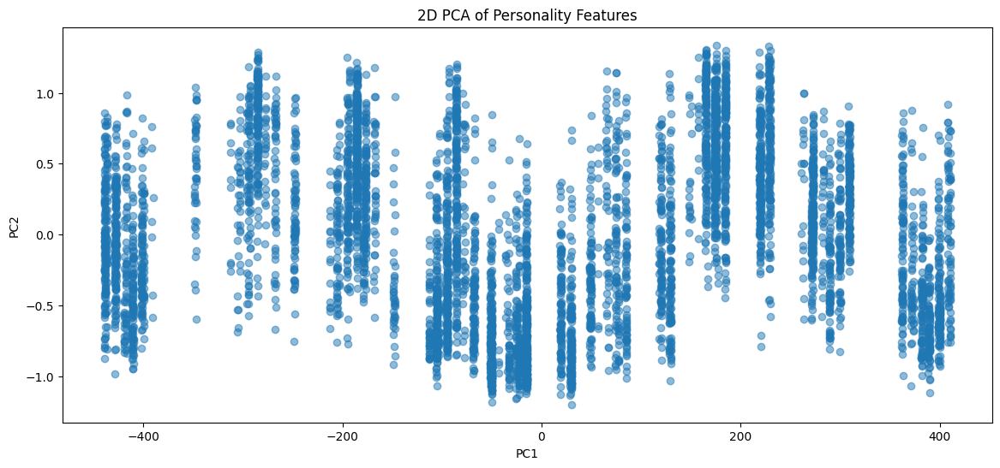

In [149]:
# now lets apply simple PCA and see what it does

from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_all.dropna())
print(pca_result)

# Visual
plt.figure(figsize=(14, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], alpha=0.5)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title("2D PCA of Personality Features")
plt.show()



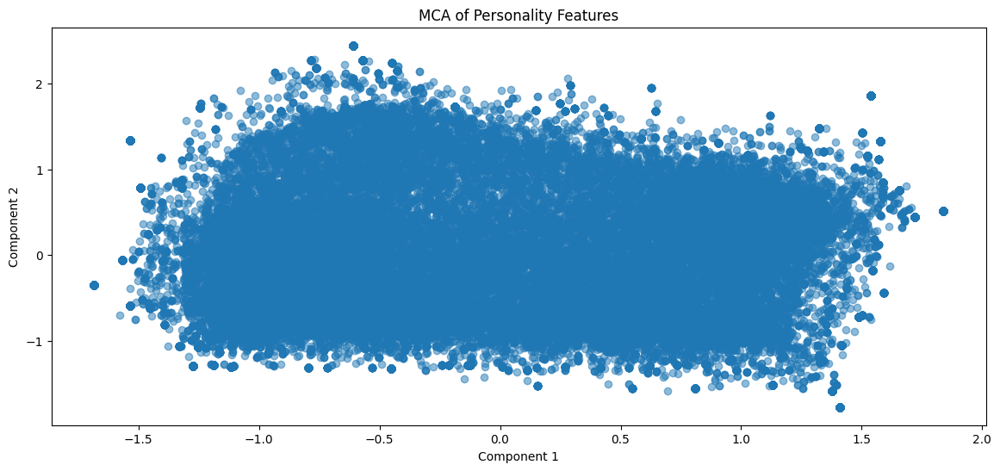

In [ ]:
import prince

# Let's try Multiple Correspondence Analysis (MCA) which doesn't require encoding for categorical 

mca = prince.MCA(n_components= 2)
mca_result = mca.fit_transform(df_clean.drop(columns=['name', 'category', 'subcategory']))
plt.figure(figsize=(14,6))
plt.scatter(mca_result[0], mca_result[1], alpha=0.5)
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.title("MCA of Personality Features")
plt.show()

